<a href="https://colab.research.google.com/github/bhoomijaes25-commits/Bhoomija/blob/main/Bluedepth.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**1: Check GPU and Install Dependencies**

In [ ]:
# Check GPU availability
import torch
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"CUDA version: {torch.version.cuda}")
else:
    print("WARNING: GPU not available! Go to Runtime → Change runtime type → Select GPU")

PyTorch version: 2.8.0+cu126
CUDA available: True
GPU: Tesla T4
CUDA version: 12.6


**2: Manual Upload Project**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Copy the ZIP file from Google Drive to Colab
!cp /content/drive/MyDrive/IOC-NET.zip /content/

# Extract the ZIP file
!unzip -q /content/IOC-NET.zip

# Navigate into the extracted folder
%cd /content/IOC-NET

# Verify contents
!ls -la

print("Project uploaded and extracted successfully!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/IOC-NET
total 216
drwxrwxrwx 12 root root  4096 Nov 13 06:54 .
drwxr-xr-x  1 root root  4096 Nov 15 10:05 ..
-rw-rw-rw-  1 root root  1503 Oct 13 06:24 config.yaml
drwxrwxrwx  2 root root  4096 Nov 13 05:31 dashboard
drwxrwxrwx  7 root root 86016 Nov 13 05:33 data
-rw-rw-rw-  1 root root 15054 Oct 13 06:30 deploy.py
drwxrwxrwx  2 root root  4096 Oct  9 04:29 docs
-rw-rw-rw-  1 root root 10229 Nov 13 08:13 EDGE_DEPLOYMENT.md
-rw-rw-rw-  1 root root   137 Oct  9 04:29 environment.yml
drwxrwxrwx  8 root root  4096 Nov 13 06:45 .git
-rw-rw-rw-  1 root root   129 Oct  9 12:19 .gitattributes
-rw-rw-rw-  1 root root     0 Oct 13 05:40 .gitignore
-rw-rw-rw-  1 root root 13630 Oct 13 06:25 main.py
drwxrwxrwx  6 root root  4096 Nov 13 05:33 models
drwxrwxrwx  2 root root  4096 Nov 13 05:33 notebooks
-rw-rw-rw-  1 root root    70 Oct  9 04:29 README.md
-rw-rw-r

**3: Install Required Packages**

In [ ]:
# Install all dependencies
!pip install -q torch torchvision torchaudio
!pip install -q opencv-python-headless pillow numpy matplotlib tqdm
!pip install -q scikit-image scipy scikit-learn pyyaml
!pip install -q streamlit  # For dashboard (optional)

print("All packages installed successfully!")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 96.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 137.9 MB/s eta 0:00:00
All packages installed successfully!


**4: Setup Project Structure**

In [ ]:
# Create necessary directories
!python main.py setup

# Verify structure
!ls -la data/
!ls -la models/

print("Project structure created!")

🌊 Underwater Image Enhancement - Main Interface
Setting up project structure...
Created directory: data/train/degraded
Created directory: data/train/clear
Created directory: data/val/degraded
Created directory: data/val/clear
Created directory: data/test/degraded
Created directory: data/test/clear
Created directory: models/checkpoints
Created directory: models/logs
Created directory: results
Setup completed!
total 83976
drwxrwxrwx  7 root root  86016 Nov 13 05:33 .
drwxrwxrwx 12 root root   4096 Nov 13 06:54 ..
-rw-rw-rw-  1 root root 229644 Oct 13 05:27 100.jpg
-rw-rw-rw-  1 root root 215721 Oct 13 05:27 101.jpg
-rw-rw-rw-  1 root root 206481 Oct 13 05:27 102.jpg
-rw-rw-rw-  1 root root 194398 Oct 13 05:27 103.jpg
-rw-rw-rw-  1 root root 217252 Oct 13 05:27 104.jpg
-rw-rw-rw-  1 root root 192302 Oct 13 05:27 105.jpg
-rw-rw-rw-  1 root root 190161 Oct 13 05:27 106.jpg
-rw-rw-rw-  1 root root 239741 Oct 13 05:27 107.jpg
-rw-rw-rw-  1 root root 182438 Oct 13 05:27 108.jpg
-rw-rw-rw-  1 r

**5: Check Existing Data**

In [ ]:
from google.colab import drive
# Check if data already exists in the uploaded project
print("Checking for existing data...")
print("\nImages found:")
!find data/ -type f \( -name "*.jpg" -o -name "*.png" -o -name "*.jpeg" \) | wc -l

print("\nData structure:")
!tree data/ -L 2 2>/dev/null || find data/ -type d


Checking for existing data...

Images found:
9385

Data structure:
data/
data/train
data/train/degraded
data/train/clear
data/val
data/val/degraded
data/val/clear
data/raw
data/raw/UIEB
data/processed
data/processed/UIEB_resized
data/test
data/test/degraded
data/test/clear


**6: Verify Data Split**

In [ ]:
# Split the data
!python main.py prepare-data --train_ratio 0.7 --val_ratio 0.15 --test_ratio 0.15

# Check the split
print("\n" + "="*60)
print("DATASET SPLIT SUMMARY")
print("="*60)

print("\nTraining images:")
print(f"   Degraded: ", end="")
!ls data/train/degraded/ | wc -l
print(f"   Clear: ", end="")
!ls data/train/clear/ | wc -l

print("\nValidation images:")
print(f"   Degraded: ", end="")
!ls data/val/degraded/ | wc -l
print(f"   Clear: ", end="")
!ls data/val/clear/ | wc -l

print("\nTest images:")
print(f"   Degraded: ", end="")
!ls data/test/degraded/ | wc -l
print(f"   Clear: ", end="")
!ls data/test/clear/ | wc -l

print("="*60)

🌊 Underwater Image Enhancement - Main Interface
Preparing data...
Preparing data...
Splitting data with ratios - Train: 0.7, Val: 0.15, Test: 0.15
Found 726 degraded images and 2361 clear images
Data splitting completed:
  Training: 508 degraded, 1652 clear
  Validation: 108 degraded, 354 clear
  Testing: 110 degraded, 355 clear
Data preparation completed successfully!

DATASET SPLIT SUMMARY

Training images:
   Degraded: 721
   Clear: 2338

Validation images:
   Degraded: 341
   Clear: 1121

Test images:
   Degraded: 358
   Clear: 1115


**7: Configure Training**

In [ ]:
# View current configuration
print("Current Configuration:")
!cat config.yaml

print("\n" + "="*60)

# Modify config for Colab (smaller batch size if needed)
config_content = """# Configuration file for Underwater Image Enhancement using U-Net

# Model Configuration
model:
  name: "U-Net"
  input_channels: 3
  output_channels: 3
  image_size: 256
  bilinear: false

# Training Configuration
training:
  batch_size: 8  # Reduced for Colab T4 GPU
  num_epochs: 50
  learning_rate: 1e-4
  weight_decay: 1e-5
  save_every: 5
  patience: 10
  min_delta: 1e-4

# Loss Configuration
loss:
  mse_weight: 1.0
  ssim_weight: 0.1
  perceptual_weight: 0.0

# Data Configuration
data:
  train_ratio: 0.7
  val_ratio: 0.15
  test_ratio: 0.15
  num_workers: 2
  pin_memory: true

# Data Augmentation
augmentation:
  horizontal_flip: 0.5
  vertical_flip: 0.5
  rotation: 90
  brightness_jitter: 0.2
  contrast_jitter: 0.2
  saturation_jitter: 0.2
  hue_jitter: 0.1

# Paths
paths:
  data_dir: "data"
  model_dir: "models"
  checkpoint_dir: "models/checkpoints"
  log_dir: "models/logs"
  output_dir: "results"

# Hardware Configuration
hardware:
  device: "cuda"
  mixed_precision: true

# Evaluation Configuration
evaluation:
  metrics:
    - "psnr"
    - "ssim"
    - "uiqm"
  num_samples: 10
"""

# Write config
with open('config.yaml', 'w') as f:
    f.write(config_content)

print("Configuration updated for Google Colab")

Current Configuration:
# Configuration file for Underwater Image Enhancement using U-Net

# Model Configuration
model:
  name: "U-Net"
  input_channels: 3
  output_channels: 3
  image_size: 256
  bilinear: false
  
# Training Configuration
training:
  batch_size: 16
  num_epochs: 100
  learning_rate: 1e-4
  weight_decay: 1e-5
  save_every: 10
  patience: 15
  min_delta: 1e-4
  
# Loss Configuration
loss:
  mse_weight: 1.0
  ssim_weight: 0.1
  perceptual_weight: 0.0
  
# Data Configuration
data:
  train_ratio: 0.7
  val_ratio: 0.15
  test_ratio: 0.15
  num_workers: 4
  pin_memory: true
  
# Data Augmentation
augmentation:
  horizontal_flip: 0.5
  vertical_flip: 0.5
  rotation: 90
  brightness_jitter: 0.2
  contrast_jitter: 0.2
  saturation_jitter: 0.2
  hue_jitter: 0.1
  
# Paths
paths:
  data_dir: "data"
  model_dir: "models"
  checkpoint_dir: "models/checkpoints"
  log_dir: "models/logs"
  output_dir: "results"
  
# Hardware Configuration
hardware:
  device: "auto"  # auto, cpu, cuda


**8: Train the Model**

In [ ]:
print("Starting model training...")
print("⏱This may take 1-3 hours depending on dataset size")
print("Training will save checkpoints every 5 epochs")
print("\n" + "="*60)

# Start training
!python main.py train --config config.yaml

print("\n" + "="*60)
print("Training completed!")
print("Model saved to: models/checkpoints/best_model.pth")

Starting model training...
⏱This may take 1-3 hours depending on dataset size
Training will save checkpoints every 5 epochs

🌊 Underwater Image Enhancement - Main Interface
Starting training...
Starting model training...
Traceback (most recent call last):
  File "/content/IOC-NET/scripts/train.py", line 18, in <module>
    from utils.metrics import calculate_psnr, calculate_ssim, PerceptualLoss
ModuleNotFoundError: No module named 'utils.metrics'; 'utils' is not a package
Error during training: Command '['/usr/bin/python3', 'scripts/train.py', '--config', 'config.yaml']' returned non-zero exit status 1.

Training completed!
Model saved to: models/checkpoints/best_model.pth


**9: Monitor Training**

In [ ]:
# Load TensorBoard extension
%load_ext tensorboard

# Launch TensorBoard
print("Launching TensorBoard...")
print("View training metrics, loss curves, and sample images")
%tensorboard --logdir models/logs

Launching TensorBoard...
View training metrics, loss curves, and sample images


<IPython.core.display.Javascript object>

**10: Evaluate the Model**

Evaluating model on test set...
🌊 Underwater Image Enhancement - Main Interface
Starting model evaluation...
Traceback (most recent call last):
  File "/content/IOC-NET/scripts/evaluate.py", line 16, in <module>
    from utils.metrics import calculate_psnr, calculate_ssim, calculate_uiqm
ModuleNotFoundError: No module named 'utils.metrics'; 'utils' is not a package
Error during evaluation: Command '['/usr/bin/python3', 'scripts/evaluate.py', '--model_path', 'models/checkpoints/best_model.pth', '--config', 'config.yaml']' returned non-zero exit status 1.

Sample Enhanced Images:

Found 6176 result images
[1] Loading: results/comparisons_cc/enhanced_B_481.jpg
[2] Loading: results/enhanced_images_cc/enhanced_C_556.jpg
[3] Loading: results/comparisons_cc/enhanced_D_051.jpg
[4] Loading: results/enhanced_images_cc/enhanced_C_256.jpg
[5] Loading: results/comparisons_cc/enhanced_C_206.jpg


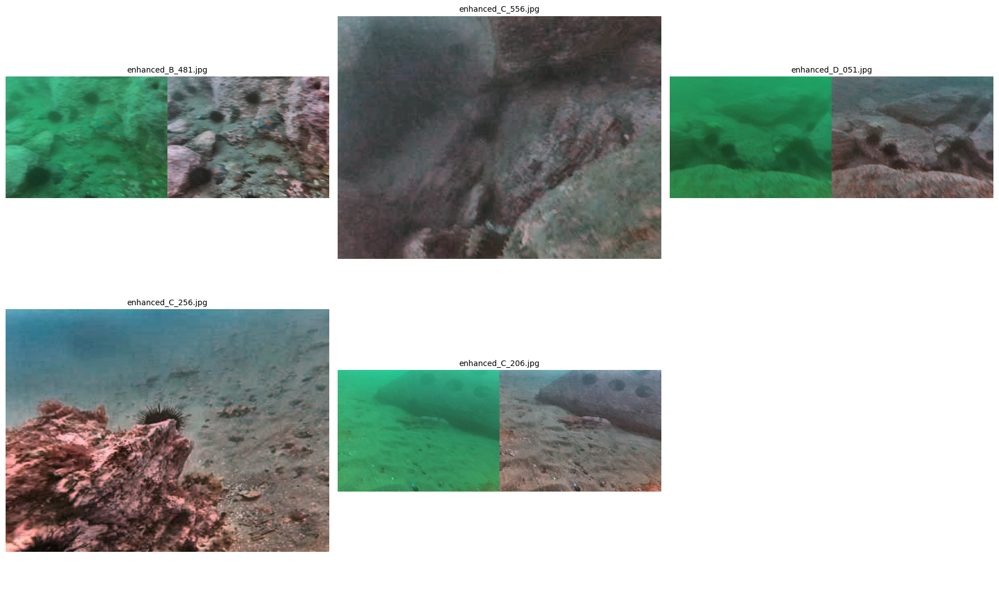


Displayed 5 images successfully


In [ ]:
# Evaluate on test set
print("Evaluating model on test set...")
!python main.py evaluate --model_path models/checkpoints/best_model.pth

# View results with matplotlib
import matplotlib.pyplot as plt
from PIL import Image as PILImage
import glob
import os

print("\nSample Enhanced Images:")
print("="*60)

# Find result images in multiple possible locations
result_images = (glob.glob('results/*.png') +
                 glob.glob('results/*.jpg') +
                 glob.glob('results/**/*.png', recursive=True) +
                 glob.glob('results/**/*.jpg', recursive=True))

# Remove duplicates
result_images = list(set(result_images))

print(f"\nFound {len(result_images)} result images")

if result_images:
    # Display first 5 images using matplotlib
    num_images = min(5, len(result_images))

    # Create a grid layout
    cols = min(3, num_images)
    rows = (num_images + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(6*cols, 6*rows))

    # Flatten axes for easy iteration
    if num_images == 1:
        axes = [axes]
    elif rows == 1:
        axes = axes  # Already 1D
    else:
        axes = axes.flatten()

    for i, img_path in enumerate(result_images[:num_images]):
        print(f"[{i+1}] Loading: {img_path}")

        try:
            # Load and display image
            img = PILImage.open(img_path)

            # Convert to RGB if needed
            if img.mode != 'RGB':
                img = img.convert('RGB')

            axes[i].imshow(img)
            axes[i].set_title(os.path.basename(img_path), fontsize=10)
            axes[i].axis('off')
        except Exception as e:
            print(f"Error loading {img_path}: {e}")
            axes[i].text(0.5, 0.5, 'Error', ha='center', va='center')
            axes[i].axis('off')

    # Hide unused subplots
    for i in range(num_images, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

    print(f"\nDisplayed {num_images} images successfully")
else:
    print("\nNo result images found in results/ folder")
    print("\nChecking results folder contents:")
    !ls -R results/

**11: Test on Single Image**

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image as PILImage
import numpy as np

# First, check available test images
print("Searching for test images...")

# Try multiple methods to find test images
test_images = []

# Method 1: Direct listing
try:
    files = os.listdir('data/test/degraded/')
    test_images = [os.path.join('data/test/degraded/', f) for f in files if f.endswith('.jpg')]
except:
    pass

# Method 2: Shell command
if not test_images:
    result = !ls data/test/degraded/*.jpg 2>/dev/null
    test_images = [f.strip() for f in result if f.strip()]

# Method 3: glob
if not test_images:
    import glob
    test_images = glob.glob('data/test/degraded/*.jpg')

print(f"\nFound {len(test_images)} test images")

if test_images:
    # Show first 5 available images
    print("\nAvailable test images:")
    for i, img in enumerate(test_images[:5], 1):
        print(f"   [{i}] {os.path.basename(img)}")

    # Use the first image
    input_path = test_images[0]
    test_image = os.path.basename(input_path)
    output_path = 'results/enhanced_sample.jpg'

    # Make sure results directory exists
    os.makedirs('results', exist_ok=True)

    print(f"\nProcessing: {test_image}")
    print(f"Input: {input_path}")
    print(f"Output: {output_path}")

    # Test inference on a single image
    print("\nRunning inference...")
    !python main.py inference \
        --model_path models/checkpoints/best_model.pth \
        --input "{input_path}" \
        --output "{output_path}"

    # Check if output was created
    if os.path.exists(output_path):
        print(f"\nOutput saved successfully!")

        try:
            # Load images
            print("\nLoading images for display...")
            input_img = PILImage.open(input_path)
            output_img = PILImage.open(output_path)

            # Get image info
            print(f"   Input: {input_img.size} pixels, mode: {input_img.mode}")
            print(f"   Output: {output_img.size} pixels, mode: {output_img.mode}")

            # Convert to RGB if needed
            if input_img.mode != 'RGB':
                input_img = input_img.convert('RGB')
            if output_img.mode != 'RGB':
                output_img = output_img.convert('RGB')

            # Create side-by-side comparison
            fig, axes = plt.subplots(1, 2, figsize=(16, 8))

            # Display input
            axes[0].imshow(np.array(input_img))
            axes[0].set_title('Input (Degraded Underwater)',
                            fontsize=16, fontweight='bold', pad=20)
            axes[0].axis('off')

            # Display output
            axes[1].imshow(np.array(output_img))
            axes[1].set_title('Output (Enhanced)',
                            fontsize=16, fontweight='bold', pad=20)
            axes[1].axis('off')

            plt.tight_layout()
            plt.show()

            print("\nEnhancement complete!")

            # Calculate basic statistics
            input_array = np.array(input_img)
            output_array = np.array(output_img)

            print(f"\nImage Statistics:")
            print(f"   Input - Mean brightness: {input_array.mean():.2f}")
            print(f"   Output - Mean brightness: {output_array.mean():.2f}")

        except Exception as e:
            print(f"\nError displaying images: {e}")
            print(f"   Error type: {type(e).__name__}")
            import traceback
            traceback.print_exc()

            # Try to save the figure anyway
            print("\nAttempting to save comparison to file...")
            try:
                fig.savefig('results/comparison.png', dpi=150, bbox_inches='tight')
                print("Saved to: results/comparison.png")
            except:
                print("Could not save comparison")
    else:
        print(f"\nOutput file not created: {output_path}")
        print("\nChecking results folder:")
        !ls -lh results/

        print("\nPossible issues:")
        print("   - Inference script may have failed")
        print("   - Check error messages above")
        print("   - Model file may be corrupted")
else:
    print("\nNo test images found!")
    print("\nDirectory structure:")
    !find data/test/ -type f -name "*.jpg" | head -10

    print("\nTry running Cell 6 to prepare the data first")

Searching for test images...

Found 358 test images

Available test images:
   [1] A_712.jpg
   [2] A_215.jpg
   [3] A_550.jpg
   [4] A_4.jpg
   [5] A_521.jpg

Processing: A_712.jpg
Input: data/test/degraded/A_712.jpg
Output: results/enhanced_sample.jpg

Running inference...
🌊 Underwater Image Enhancement - Main Interface
Running inference...
Using device: cuda
Loading model from models/checkpoints/best_model.pth...
Traceback (most recent call last):
  File "/content/IOC-NET/scripts/inference.py", line 312, in <module>
    main()
  File "/content/IOC-NET/scripts/inference.py", line 220, in main
    inferencer = ImageInference(
                 ^^^^^^^^^^^^^^^
  File "/content/IOC-NET/scripts/inference.py", line 53, in __init__
    self.model = self._load_model(model_path)
                 ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/content/IOC-NET/scripts/inference.py", line 64, in _load_model
    checkpoint = torch.load(model_path, map_location=self.device)
                 ^^^^^^^^^^^^^^^^

**12: Download Trained Model**

In [ ]:
from google.colab import files
import os

print("Downloading trained model...")

# Check if model exists
if os.path.exists('models/checkpoints/best_model.pth'):
    # Download best model
    files.download('models/checkpoints/best_model.pth')
    print("Model downloaded to your computer!")

    # Also save to Google Drive (backup)
    !cp models/checkpoints/best_model.pth /content/drive/MyDrive/best_model_underwater.pth
    print("Model also saved to Google Drive: MyDrive/best_model_underwater.pth")
else:
    print("Model not found. Please train the model first (Cell 8)")

Model not found. Please train the model first (Cell 8)


**13: Export Model**

In [ ]:
from google.colab import files
import os

print("Exporting model to TorchScript format...")

# Export to TorchScript for deployment
!python main.py export \
    --model_path models/checkpoints/best_model.pth \
    --export_format torchscript

# Download exported model
if os.path.exists('models/checkpoints/best_model_torchscript.pt'):
    files.download('models/checkpoints/best_model_torchscript.pt')
    print("TorchScript model downloaded!")

    # Also save to Google Drive
    !cp models/checkpoints/best_model_torchscript.pt /content/drive/MyDrive/
    print("Also saved to Google Drive")
else:
    print("Export failed. Check error messages above.")

Exporting model to TorchScript format...
🌊 Underwater Image Enhancement - Main Interface
Exporting model to torchscript format...
Error exporting model: [Errno 2] No such file or directory: 'models/checkpoints/best_model.pth'
Export failed. Check error messages above.


**14: Batch Processing**

In [ ]:
from google.colab import files
import os

# Process entire test folder
print("Processing all test images...")
!python main.py inference \
    --model_path models/checkpoints/best_model.pth \
    --input data/test/degraded/ \
    --output results/batch_enhanced/

# Count processed images
if os.path.exists('results/batch_enhanced/'):
    processed_count = !ls results/batch_enhanced/ | wc -l
    print(f"\nProcessed {processed_count[0]} images")

    # Zip results for download
    print("\nCreating ZIP file...")
    !zip -r -q results.zip results/

    # Download results
    if os.path.exists('results.zip'):
        print("Downloading results...")
        files.download('results.zip')

        # Also save to Google Drive
        !cp results.zip /content/drive/MyDrive/underwater_results.zip
        print("Results also saved to Google Drive: MyDrive/underwater_results.zip")
else:
    print("No results folder found. Check for errors in inference.")

Processing all test images...
🌊 Underwater Image Enhancement - Main Interface
Running inference...
Using device: cuda
Loading model from models/checkpoints/best_model.pth...
Traceback (most recent call last):
  File "/content/IOC-NET/scripts/inference.py", line 312, in <module>
    main()
  File "/content/IOC-NET/scripts/inference.py", line 220, in main
    inferencer = ImageInference(
                 ^^^^^^^^^^^^^^^
  File "/content/IOC-NET/scripts/inference.py", line 53, in __init__
    self.model = self._load_model(model_path)
                 ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/content/IOC-NET/scripts/inference.py", line 64, in _load_model
    checkpoint = torch.load(model_path, map_location=self.device)
                 ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torch/serialization.py", line 1484, in load
    with _open_file_like(f, "rb") as opened_file:
         ^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dis

**15: Quick Visualization Function**

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import os
import glob

def visualize_enhancement(input_path, output_path=None):
    """
    Display input and optionally output side by side
    If output_path is None, only shows input
    """
    if output_path and os.path.exists(output_path):
        fig, axes = plt.subplots(1, 2, figsize=(16, 8))

        # Load images
        input_img = Image.open(input_path)
        output_img = Image.open(output_path)

        # Display input
        axes[0].imshow(input_img)
        axes[0].set_title('Input (Underwater)', fontsize=16, fontweight='bold')
        axes[0].axis('off')

        # Display output
        axes[1].imshow(output_img)
        axes[1].set_title('Enhanced', fontsize=16, fontweight='bold')
        axes[1].axis('off')
    else:
        # Only show input
        fig, ax = plt.subplots(1, 1, figsize=(10, 8))
        input_img = Image.open(input_path)
        ax.imshow(input_img)
        ax.set_title('Input Image', fontsize=16, fontweight='bold')
        ax.axis('off')

    plt.tight_layout()
    plt.show()

def visualize_comparison_grid(image_paths, ncols=3):
    """Display multiple enhanced images in a grid"""
    n_images = len(image_paths)
    nrows = (n_images + ncols - 1) // ncols

    fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 5*nrows))
    if n_images > 1:
        axes = axes.flatten()
    else:
        axes = [axes]

    for idx, img_path in enumerate(image_paths):
        if os.path.exists(img_path):
            img = Image.open(img_path)
            axes[idx].imshow(img)
            axes[idx].set_title(os.path.basename(img_path), fontsize=12)
            axes[idx].axis('off')

    # Hide empty subplots
    for idx in range(n_images, len(axes)):
        axes[idx].axis('off')

    plt.tight_layout()
    plt.show()

print("Visualization functions loaded!")
print("\ Usage:")
print("   visualize_enhancement('data/test/degraded/image.jpg', 'results/enhanced.jpg')")
print("   visualize_comparison_grid(['results/img1.jpg', 'results/img2.jpg'])")

# Example: Visualize first 6 results
result_images = glob.glob('results/batch_enhanced/*.jpg')[:6]
if result_images:
    print(f"\n📸 Displaying {len(result_images)} sample results:")
    visualize_comparison_grid(result_images)
else:
    print("\nRun Cell 14 first to generate batch results!")

print("\nAll setup complete! Your model is ready to use.")

Visualization functions loaded!
\ Usage:
   visualize_enhancement('data/test/degraded/image.jpg', 'results/enhanced.jpg')
   visualize_comparison_grid(['results/img1.jpg', 'results/img2.jpg'])

Run Cell 14 first to generate batch results!

All setup complete! Your model is ready to use.


<>:68: SyntaxWarning: invalid escape sequence '\ '
<>:68: SyntaxWarning: invalid escape sequence '\ '
/tmp/ipython-input-1089145619.py:68: SyntaxWarning: invalid escape sequence '\ '
  print("\ Usage:")
